#**Logistic Regression HandsOn**

Dataset Link: https://drive.google.com/file/d/1aNH7c_wJxJLaXtnJPDcVKjRKCfc-ZRTt/view?usp=sharing

#**Problem Statement**
We have to use ML techniques to make sure that you are getting the correct prediction for whom to give loan or not.

#**Step-1 Import the Libraries**

**Mandatory Libraries**

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

**Configuration library**

In [4]:
import warnings  # Warning are not error
warnings.filterwarnings('ignore')

**Machine Learning Libraries**

In [5]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import * # Imported all metrics

##**Step-2 Data Loading**

In [6]:
df = pd.read_csv('/content/bank-additional-full.csv', sep=';')
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56.0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57.0,services,married,high.school,unknown,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37.0,services,married,high.school,no,yes,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40.0,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56.0,services,married,high.school,no,no,yes,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41194,74.0,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,3.0,999.0,1.0,failure,-1.1,94.767,-50.8,1.028,4963.6,no
41195,74.0,NaN,married,professional.course,no,yes,no,cellular,nov,fri,...,3.0,999.0,1.0,failure,-1.1,94.767,-50.8,1.028,4963.6,no
41196,74.0,retired,married,NaN,no,yes,no,cellular,nov,fri,...,3.0,999.0,1.0,failure,-1.1,94.767,-50.8,1.028,4963.6,no
41197,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Column inspection**

In [7]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [8]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56.0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57.0,services,married,high.school,unknown,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37.0,services,married,high.school,no,yes,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40.0,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56.0,services,married,high.school,no,no,yes,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


**Insigts**
* The target column is y
* All other columns are the feature column

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41199 entries, 0 to 41198
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41195 non-null  float64
 1   job             41194 non-null  object 
 2   marital         41194 non-null  object 
 3   education       41194 non-null  object 
 4   default         41195 non-null  object 
 5   housing         41196 non-null  object 
 6   loan            41195 non-null  object 
 7   contact         41195 non-null  object 
 8   month           41196 non-null  object 
 9   day_of_week     41196 non-null  object 
 10  duration        41196 non-null  float64
 11  campaign        41196 non-null  float64
 12  pdays           41196 non-null  float64
 13  previous        41196 non-null  float64
 14  poutcome        41194 non-null  object 
 15  emp.var.rate    41196 non-null  float64
 16  cons.price.idx  41195 non-null  float64
 17  cons.conf.idx   41196 non-null 

**Insight**
* There are some Null values
* Data encoding is needed
* Need to remove some irrelevent columns
* Duplicate needed to be checked

**Shape inspection**

In [10]:
a = df.shape
print(f'The rows are: {a[0]} and columns are {a[1]}')

The rows are: 41199 and columns are 21


**Statistical Summary**

In [11]:
df.describe().T # Stats for numeric columns

,count,mean,std,min,25%,50%,75%,max
age,41195.0,40.030319,10.431818,17.000,32.000,38.000,47.000,98.000
duration,41196.0,258.281265,259.254211,0.000,102.000,180.000,319.000,4918.000
campaign,41196.0,2.567676,2.769751,1.000,1.000,2.000,3.000,56.000
pdays,41196.0,962.482547,186.893451,0.000,999.000,999.000,999.000,999.000
previous,41196.0,0.173124,0.494987,0.000,0.000,0.000,0.000,7.000
emp.var.rate,41196.0,0.081656,1.570894,-3.400,-1.800,1.100,1.400,1.400
cons.price.idx,41195.0,93.575867,0.578999,92.201,93.075,93.749,93.994,94.767
cons.conf.idx,41196.0,-40.504600,4.629972,-50.800,-42.700,-41.800,-36.400,-26.900
euribor3m,41196.0,3.620787,1.734655,0.634,1.344,4.857,4.961,5.045
nr.employed,41196.0,5166.996405,72.300104,4963.600,5099.100,5191.000,5228.100,5228.100


In [12]:
df.describe(include='O').T # Stats of Obejct Columns

,count,unique,top,freq
job,41194,12,admin.,10422
marital,41194,4,married,24934
education,41194,8,university.degree,12168
default,41195,3,no,32595
housing,41196,3,yes,21584
loan,41195,3,no,33957
contact,41195,2,cellular,26151
month,41196,10,may,13769
day_of_week,41196,5,thu,8623
poutcome,41194,3,nonexistent,35563


In [13]:
df.describe(include='all').T # For both object and nmerical columns

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,41195.0,NaN,NaN,NaN,40.030319,10.431818,17.0,32.0,38.0,47.0,98.0
job,41194,12,admin.,10422,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital,41194,4,married,24934,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education,41194,8,university.degree,12168,NaN,NaN,NaN,NaN,NaN,NaN,NaN
default,41195,3,no,32595,NaN,NaN,NaN,NaN,NaN,NaN,NaN
housing,41196,3,yes,21584,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan,41195,3,no,33957,NaN,NaN,NaN,NaN,NaN,NaN,NaN
contact,41195,2,cellular,26151,NaN,NaN,NaN,NaN,NaN,NaN,NaN
month,41196,10,may,13769,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day_of_week,41196,5,thu,8623,NaN,NaN,NaN,NaN,NaN,NaN,NaN


##**Step-3 Data Cleaning**

In [14]:
df.isnull().sum()

,0
age,4
job,5
marital,5
education,5
default,4
housing,3
loan,4
contact,4
month,3
day_of_week,3


In [15]:
df.isnull().sum().sum()

np.int64(76)

In [16]:
df.dropna(inplace=True)
# df = df.dropna()

In [17]:
df.isnull().sum()

,0
age,0
job,0
marital,0
education,0
default,0
housing,0
loan,0
contact,0
month,0
day_of_week,0


**Check Duplicated**

In [18]:
df.duplicated().sum()

np.int64(13)

In [19]:
df[df.duplicated()==True]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
1266,39.0,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
12261,36.0,retired,married,unknown,no,no,no,telephone,jul,thu,...,1.0,999.0,0.0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
14234,27.0,technician,single,professional.course,no,no,no,cellular,jul,mon,...,2.0,999.0,0.0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47.0,technician,divorced,high.school,no,yes,no,cellular,jul,thu,...,3.0,999.0,0.0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
18465,32.0,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,1.0,999.0,0.0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
20216,55.0,services,married,high.school,unknown,no,no,cellular,aug,mon,...,1.0,999.0,0.0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,no
20534,41.0,technician,married,professional.course,no,yes,no,cellular,aug,tue,...,1.0,999.0,0.0,nonexistent,1.4,93.444,-36.1,4.966,5228.1,no
25217,39.0,admin.,married,university.degree,no,no,no,cellular,nov,tue,...,2.0,999.0,0.0,nonexistent,-0.1,93.200,-42.0,4.153,5195.8,no
28477,24.0,services,single,high.school,no,yes,no,cellular,apr,tue,...,1.0,999.0,0.0,nonexistent,-1.8,93.075,-47.1,1.423,5099.1,no
32516,35.0,admin.,married,university.degree,no,yes,no,cellular,may,fri,...,4.0,999.0,0.0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no


In [20]:
df.drop_duplicates(inplace = True)

In [21]:
df.duplicated().sum()

np.int64(0)

In [22]:
a = df.shape
print(f'The rows are: {a[0]} and columns are {a[1]}')

The rows are: 41177 and columns are 21


##**Outlier Analysis**

In [23]:
import plotly.express as px

In [24]:
col_list = df.columns

for x in col_list:
  if df[x].dtype != 'object':
    fig = px.box(df[x], title = f'Box plot of {x} column')
    fig.update_layout(width = 500, height = 500)
    fig.show()

In [25]:
outlier_col = ['age','duration','campaign','cons.conf.idx']

In [26]:
for x in outlier_col:
  Q1 = df[x].quantile(0.25)
  Q3 = df[x].quantile(0.75)
  IQR = Q3 - Q1
  LF = Q1 - (1.5*IQR)
  UF = Q3 + (1.5*IQR)
# Keep the values between UF and LF
  df = df[(df[x]>=LF) & (df[x]<=UF)]

In [27]:
col_list = df.columns

for x in col_list:
  if df[x].dtype != 'object':
    fig = px.box(df[x], title = f'Box plot of {x} column')
    fig.update_layout(width = 500, height = 500)
    fig.show()

In [28]:
a = df.shape
print(f'The rows are: {a[0]} and columns are {a[1]}')

The rows are: 35165 and columns are 21


##**Feature Selection**
* Correlation
* VIF
* RFE

**Correlation**

In [29]:
corrMat = df.select_dtypes(include=['number']).corr()
corrMat

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
age,1.000000,0.002694,0.012643,0.004257,-0.023142,0.076681,0.041054,0.102274,0.088340,0.074006
duration,0.002694,1.000000,-0.057019,-0.073896,0.045881,-0.051410,0.001239,-0.002723,-0.059857,-0.078508
campaign,0.012643,-0.057019,1.000000,0.042143,-0.057057,0.089231,0.067005,-0.005738,0.074475,0.084622
pdays,0.004257,-0.073896,0.042143,1.000000,-0.574387,0.261084,0.064616,-0.072250,0.288853,0.368947
previous,-0.023142,0.045881,-0.057057,-0.574387,1.000000,-0.420205,-0.200631,-0.088675,-0.453358,-0.502100
emp.var.rate,0.076681,-0.051410,0.089231,0.261084,-0.420205,1.000000,0.767724,0.309361,0.972554,0.901892
cons.price.idx,0.041054,0.001239,0.067005,0.064616,-0.200631,0.767724,1.000000,0.149011,0.681468,0.503772
cons.conf.idx,0.102274,-0.002723,-0.005738,-0.072250,-0.088675,0.309361,0.149011,1.000000,0.373525,0.200479
euribor3m,0.088340,-0.059857,0.074475,0.288853,-0.453358,0.972554,0.681468,0.373525,1.000000,0.943603
nr.employed,0.074006,-0.078508,0.084622,0.368947,-0.502100,0.901892,0.503772,0.200479,0.943603,1.000000


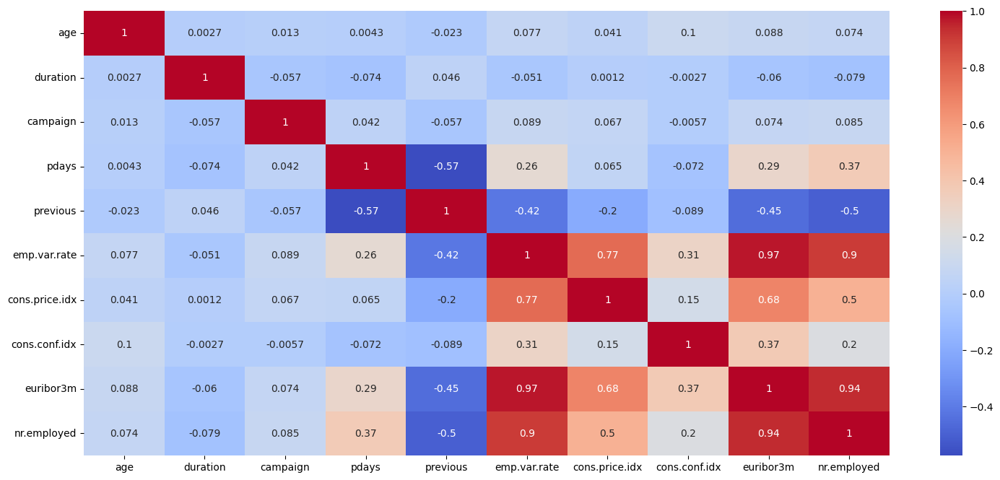

In [30]:
fig = plt.figure(figsize = (18,8))
sns.heatmap(corrMat, annot = True, cmap = 'coolwarm')
plt.show()

In [31]:
cat_col = []
for x in df.columns:
  if df[x].dtype == 'object':
    cat_col.append(x)

In [32]:
cat_col

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'day_of_week',
 'poutcome',
 'y']

**Let's Encode the data**

In [33]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
labelMap = {}
for x in cat_col:
  df[x] = le.fit_transform(df[x])
  labelMap[x] = dict(zip(le.classes_, le.transform(le.classes_)))
  print(f'{x} : {labelMap[x]}')

job : {'admin.': np.int64(0), 'blue-collar': np.int64(1), 'entrepreneur': np.int64(2), 'housemaid': np.int64(3), 'management': np.int64(4), 'retired': np.int64(5), 'self-employed': np.int64(6), 'services': np.int64(7), 'student': np.int64(8), 'technician': np.int64(9), 'unemployed': np.int64(10), 'unknown': np.int64(11)}
marital : {'divorced': np.int64(0), 'married': np.int64(1), 'single': np.int64(2), 'unknown': np.int64(3)}
education : {'basic.4y': np.int64(0), 'basic.6y': np.int64(1), 'basic.9y': np.int64(2), 'high.school': np.int64(3), 'illiterate': np.int64(4), 'professional.course': np.int64(5), 'university.degree': np.int64(6), 'unknown': np.int64(7)}
default : {'no': np.int64(0), 'unknown': np.int64(1), 'yes': np.int64(2)}
housing : {'no': np.int64(0), 'unknown': np.int64(1), 'yes': np.int64(2)}
loan : {'no': np.int64(0), 'unknown': np.int64(1), 'yes': np.int64(2)}
contact : {'cellular': np.int64(0), 'telephone': np.int64(1)}
month : {'apr': np.int64(0), 'aug': np.int64(1), 'de

In [34]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56.0,3,1,0,0,0,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
1,57.0,7,1,3,1,0,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
2,37.0,7,1,3,0,2,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
3,40.0,0,1,1,0,0,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
4,56.0,7,1,3,0,0,2,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0


In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 35165 entries, 0 to 41186
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             35165 non-null  float64
 1   job             35165 non-null  int64  
 2   marital         35165 non-null  int64  
 3   education       35165 non-null  int64  
 4   default         35165 non-null  int64  
 5   housing         35165 non-null  int64  
 6   loan            35165 non-null  int64  
 7   contact         35165 non-null  int64  
 8   month           35165 non-null  int64  
 9   day_of_week     35165 non-null  int64  
 10  duration        35165 non-null  float64
 11  campaign        35165 non-null  float64
 12  pdays           35165 non-null  float64
 13  previous        35165 non-null  float64
 14  poutcome        35165 non-null  int64  
 15  emp.var.rate    35165 non-null  float64
 16  cons.price.idx  35165 non-null  float64
 17  cons.conf.idx   35165 non-null  floa

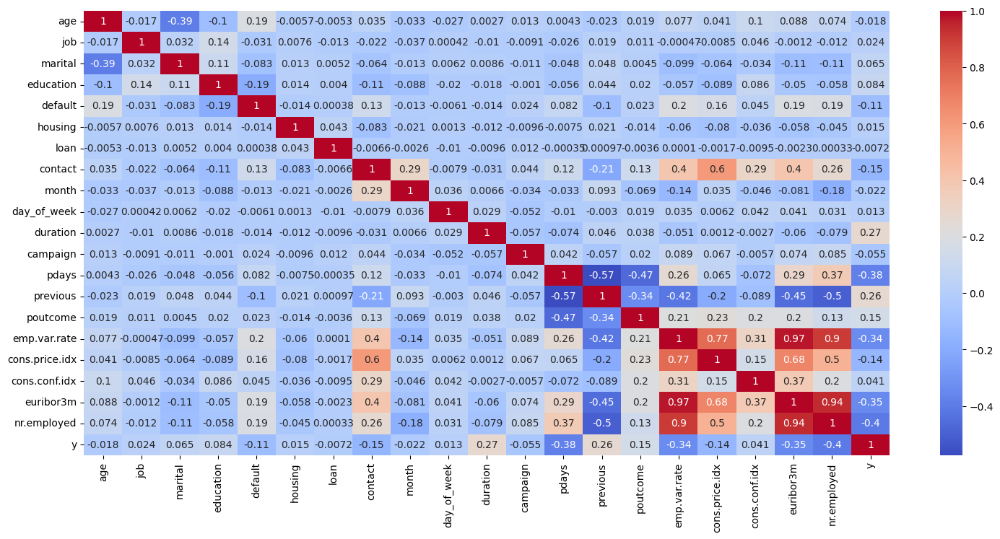

In [36]:
plt.figure(figsize=(18,8)) # inch (wide),(tall)
sns.heatmap(df.corr(),annot=True,cmap='coolwarm')
plt.show()

##**VIF - variance Inflation Factor (Multicollinearity)**
VIF will tell us how much a particular independent column(X1) is correlated with other independent column (**In a regression model**)

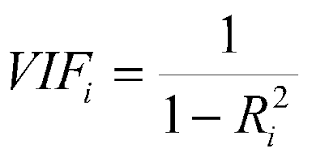
* VIF score = 1 (Ideal independent feature)
* VIF Score <= 5 (good Feature)
* VIF Score > 6 (Multicollinearity Remove)

**Note**
* If VIF is high --> X1 is highly correlated with X2 (Multicollinearity)
* If VIF is low --- The columns are mostly independent

In [37]:
df2 = df

In [38]:
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif

In [39]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [40]:
x = df.drop(columns=['y'])

In [41]:
x.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed'],
      dtype='object')

###**Steps to Implement VIF**
* We will check VIF score of columns
* maximum VIF score column we will drop
* We iterate to check updated VIF Score again

In [42]:
x.values

array([[ 5.6000e+01,  3.0000e+00,  1.0000e+00, ..., -3.6400e+01,
         4.8570e+00,  5.1910e+03],
       [ 5.7000e+01,  7.0000e+00,  1.0000e+00, ..., -3.6400e+01,
         4.8570e+00,  5.1910e+03],
       [ 3.7000e+01,  7.0000e+00,  1.0000e+00, ..., -3.6400e+01,
         4.8570e+00,  5.1910e+03],
       ...,
       [ 4.6000e+01,  1.0000e+00,  1.0000e+00, ..., -5.0800e+01,
         1.0280e+00,  4.9636e+03],
       [ 5.6000e+01,  5.0000e+00,  1.0000e+00, ..., -5.0800e+01,
         1.0280e+00,  4.9636e+03],
       [ 4.4000e+01,  9.0000e+00,  1.0000e+00, ..., -5.0800e+01,
         1.0280e+00,  4.9636e+03]])

**Iteration 1**

In [43]:
vif_data = pd.DataFrame()
vif_data['Features'] = x.columns
vif_data['VIF Score'] = [vif(x.values,i) for i in range(len(x.columns))]
max_vifRow = vif_data.loc[vif_data['VIF Score']== vif_data['VIF Score'].max()]
a = max_vifRow['Features']
print(vif_data)
print('===============')
print(f'maximum vif value columns is: {a}')

          Features     VIF Score
0              age     22.113993
1              job      2.100861
2          marital      5.690071
3        education      4.560285
4          default      1.411946
5          housing      2.212409
6             loan      1.208306
7          contact      2.942422
8            month      6.685085
9      day_of_week      3.099808
10        duration      3.231026
11        campaign      3.615256
12           pdays    174.895512
13        previous      6.070087
14        poutcome     34.934345
15    emp.var.rate     37.592081
16  cons.price.idx  37885.320838
17   cons.conf.idx    143.576459
18       euribor3m    322.672944
19     nr.employed  43115.201160
maximum vif value columns is: 19    nr.employed
Name: Features, dtype: object


In [44]:
df = df.drop('nr.employed',axis = 1)

**Iteration 2**

In [45]:
x = df.drop(columns=['y'])
vif_data = pd.DataFrame()
vif_data['Features'] = x.columns
vif_data['VIF Score'] = [vif(x.values,i) for i in range(len(x.columns))]
max_vifRow = vif_data.loc[vif_data['VIF Score']== vif_data['VIF Score'].max()]
a = max_vifRow['Features']
print(vif_data)
print('===============')
print(f'maximum vif value columns is: {a}')

          Features   VIF Score
0              age   22.107715
1              job    2.100612
2          marital    5.689362
3        education    4.558657
4          default    1.409350
5          housing    2.212084
6             loan    1.208260
7          contact    2.446094
8            month    5.784547
9      day_of_week    3.098930
10        duration    3.221277
11        campaign    3.602129
12           pdays  174.850562
13        previous    5.973295
14        poutcome   34.669168
15    emp.var.rate   22.287122
16  cons.price.idx  729.560618
17   cons.conf.idx  124.902304
18       euribor3m  130.883838
maximum vif value columns is: 16    cons.price.idx
Name: Features, dtype: object


In [46]:
df = df.drop(a,axis=1)

**Iteration 3**

In [47]:
x = df.drop(columns=['y'])
vif_data = pd.DataFrame()
vif_data['Features'] = x.columns
vif_data['VIF Score'] = [vif(x.values,i) for i in range(len(x.columns))]
max_vifRow = vif_data.loc[vif_data['VIF Score']== vif_data['VIF Score'].max()]
a = max_vifRow['Features']
print(vif_data)
print('===============')
print(f'maximum vif value columns is: {a}')

         Features  VIF Score
0             age  20.980560
1             job   2.095040
2         marital   5.544426
3       education   4.503309
4         default   1.409322
5         housing   2.210417
6            loan   1.207694
7         contact   2.348235
8           month   5.726141
9     day_of_week   3.084650
10       duration   3.196457
11       campaign   3.585901
12          pdays  95.504094
13       previous   3.040971
14       poutcome  17.519163
15   emp.var.rate  16.710516
16  cons.conf.idx  82.695453
17      euribor3m  93.815501
maximum vif value columns is: 12    pdays
Name: Features, dtype: object


In [48]:
df = df.drop(a,axis=1)

**Iteration 4**

In [49]:
x = df.drop(columns=['y'])
vif_data = pd.DataFrame()
vif_data['Features'] = x.columns
vif_data['VIF Score'] = [vif(x.values,i) for i in range(len(x.columns))]
max_vifRow = vif_data.loc[vif_data['VIF Score']== vif_data['VIF Score'].max()]
a = max_vifRow['Features']
print(vif_data)
print('===============')
print(f'maximum vif value columns is: {a}')

         Features  VIF Score
0             age  20.156176
1             job   2.091851
2         marital   5.426164
3       education   4.449798
4         default   1.409226
5         housing   2.206690
6            loan   1.207556
7         contact   2.274814
8           month   5.664673
9     day_of_week   3.072542
10       duration   3.184520
11       campaign   3.566503
12       previous   1.497582
13       poutcome   8.132807
14   emp.var.rate  12.914012
15  cons.conf.idx  42.662876
16      euribor3m  63.941291
maximum vif value columns is: 16    euribor3m
Name: Features, dtype: object


In [50]:
df = df.drop(a,axis=1)

**Iteration 5**

In [51]:
x = df.drop(columns=['y'])
vif_data = pd.DataFrame()
vif_data['Features'] = x.columns
vif_data['VIF Score'] = [vif(x.values,i) for i in range(len(x.columns))]
max_vifRow = vif_data.loc[vif_data['VIF Score']== vif_data['VIF Score'].max()]
a = max_vifRow['Features']
print(vif_data)
print('===============')
print(f'maximum vif value columns is: {a}')

         Features  VIF Score
0             age  17.204219
1             job   2.085747
2         marital   5.226350
3       education   4.292137
4         default   1.408832
5         housing   2.198757
6            loan   1.207316
7         contact   2.266725
8           month   5.270616
9     day_of_week   3.032416
10       duration   3.177169
11       campaign   3.560596
12       previous   1.479792
13       poutcome   8.004800
14   emp.var.rate   1.547619
15  cons.conf.idx  32.081295
maximum vif value columns is: 15    cons.conf.idx
Name: Features, dtype: object


In [52]:
df = df.drop(a,axis=1)

**Iteration 6**

In [53]:
x = df.drop(columns=['y'])
vif_data = pd.DataFrame()
vif_data['Features'] = x.columns
vif_data['VIF Score'] = [vif(x.values,i) for i in range(len(x.columns))]
max_vifRow = vif_data.loc[vif_data['VIF Score']== vif_data['VIF Score'].max()]
a = max_vifRow['Features']
print(vif_data)
print('===============')
print(f'maximum vif value columns is: {a}')

        Features  VIF Score
0            age  11.058997
1            job   2.076503
2        marital   4.372058
3      education   4.193335
4        default   1.407850
5        housing   2.162435
6           loan   1.204070
7        contact   2.242675
8          month   4.871672
9    day_of_week   2.969072
10      duration   3.105927
11      campaign   3.394175
12      previous   1.477225
13      poutcome   7.682693
14  emp.var.rate   1.532256
maximum vif value columns is: 0    age
Name: Features, dtype: object


In [54]:
df = df.drop(a,axis=1)

**Iteration 7**

In [55]:
x = df.drop(columns=['y'])
vif_data = pd.DataFrame()
vif_data['Features'] = x.columns
vif_data['VIF Score'] = [vif(x.values,i) for i in range(len(x.columns))]
max_vifRow = vif_data.loc[vif_data['VIF Score']== vif_data['VIF Score'].max()]
a = max_vifRow['Features']
print(vif_data)
print('===============')
print(f'maximum vif value columns is: {a}')

        Features  VIF Score
0            job   2.053348
1        marital   4.351772
2      education   4.013198
3        default   1.323133
4        housing   2.112544
5           loan   1.200876
6        contact   2.241469
7          month   4.605944
8    day_of_week   2.888478
9       duration   2.988925
10      campaign   3.194073
11      previous   1.442307
12      poutcome   6.538761
13  emp.var.rate   1.531336
maximum vif value columns is: 12    poutcome
Name: Features, dtype: object


In [56]:
df = df.drop(a,axis=1)

**Iteration 8**

In [57]:
x = df.drop(columns=['y'])
vif_data = pd.DataFrame()
vif_data['Features'] = x.columns
vif_data['VIF Score'] = [vif(x.values,i) for i in range(len(x.columns))]
max_vifRow = vif_data.loc[vif_data['VIF Score']== vif_data['VIF Score'].max()]
a = max_vifRow['Features']
print(vif_data)
print('===============')
print(f'maximum vif value columns is: {a}')

        Features  VIF Score
0            job   2.034164
1        marital   4.135585
2      education   3.788774
3        default   1.313522
4        housing   2.080645
5           loan   1.198855
6        contact   2.225619
7          month   4.490123
8    day_of_week   2.803667
9       duration   2.834777
10      campaign   3.069132
11      previous   1.371570
12  emp.var.rate   1.522988
maximum vif value columns is: 7    month
Name: Features, dtype: object


Since, We have VIF score less than 5. We can Stop performing VIF

In [58]:
df

,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,previous,emp.var.rate,y
0,3,1,0,0,0,0,1,6,1,261.0,1.0,0.0,1.1,0
1,7,1,3,1,0,0,1,6,1,149.0,1.0,0.0,1.1,0
2,7,1,3,0,2,0,1,6,1,226.0,1.0,0.0,1.1,0
3,0,1,1,0,0,0,1,6,1,151.0,1.0,0.0,1.1,0
4,7,1,3,0,0,2,1,6,1,307.0,1.0,0.0,1.1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41181,0,1,6,0,2,0,0,7,0,281.0,1.0,0.0,-1.1,1
41182,10,2,0,0,2,0,0,7,0,112.0,1.0,1.0,-1.1,0
41184,1,1,5,0,0,0,0,7,0,383.0,1.0,0.0,-1.1,0
41185,5,1,6,0,2,0,0,7,0,189.0,2.0,0.0,-1.1,0


## **Step -4 Model Building**

In [59]:
x # ---> Independent colums
y = df['y'] # ----> Target colummns

**spliting the data**

In [60]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state = 42)

In [61]:
x_train # ----- Learning Questions

,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,previous,emp.var.rate
27108,0,0,6,0,2,0,0,7,0,195.0,1.0,0.0,-0.1
28020,9,2,5,0,0,0,0,0,2,121.0,1.0,1.0,-1.8
36195,11,1,0,0,2,2,0,6,2,110.0,2.0,0.0,-1.8
31823,1,1,0,0,1,1,0,6,2,67.0,3.0,0.0,-1.8
7448,7,2,5,0,2,0,1,6,0,120.0,3.0,0.0,1.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19780,1,1,0,1,2,0,0,1,0,205.0,1.0,0.0,1.4
7043,7,2,3,0,0,0,1,6,2,70.0,2.0,0.0,1.1
13010,1,2,2,0,2,0,0,3,3,154.0,3.0,0.0,1.4
910,1,0,1,1,2,0,1,6,4,107.0,1.0,0.0,1.1


In [62]:
y_train  # Answers for my model to leaern

,y
27108,0
28020,0
36195,0
31823,0
7448,0
...,...
19780,0
7043,0
13010,0
910,0


In [63]:
x_test # Exam Questions

,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,previous,emp.var.rate
13886,5,1,6,0,2,0,0,3,0,188.0,2.0,0.0,1.4
21624,0,1,6,0,2,0,0,1,3,154.0,1.0,0.0,1.4
30053,11,1,0,0,2,0,0,0,2,477.0,2.0,0.0,-1.8
13645,6,1,2,0,0,0,0,3,2,259.0,1.0,0.0,1.4
37419,8,2,0,0,2,0,0,1,4,267.0,1.0,0.0,-2.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7612,0,1,3,0,0,0,1,6,0,80.0,2.0,0.0,1.1
25891,0,1,6,0,0,0,0,7,4,117.0,1.0,0.0,-0.1
23025,1,1,2,1,2,0,0,1,3,60.0,4.0,0.0,1.4
9916,1,0,3,0,0,0,1,4,4,134.0,2.0,0.0,1.4


In [64]:
y_test # Answer Key

,y
13886,0
21624,0
30053,0
13645,0
37419,1
...,...
7612,0
25891,0
23025,0
9916,0


In [65]:
# y_pred ------(my Model answer during exam) we need to find

**Creating a model**

In [66]:
model = LogisticRegression()
model.fit(x_train,y_train)

LogisticRegression()

In [67]:
y_pred = model.predict(x_test)

In [68]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

**Evalutaion**
* Confusion Matrix
* Classification Report
* accuracy score

In [69]:
accuracy_score(y_test,y_pred)

0.9259715639810426

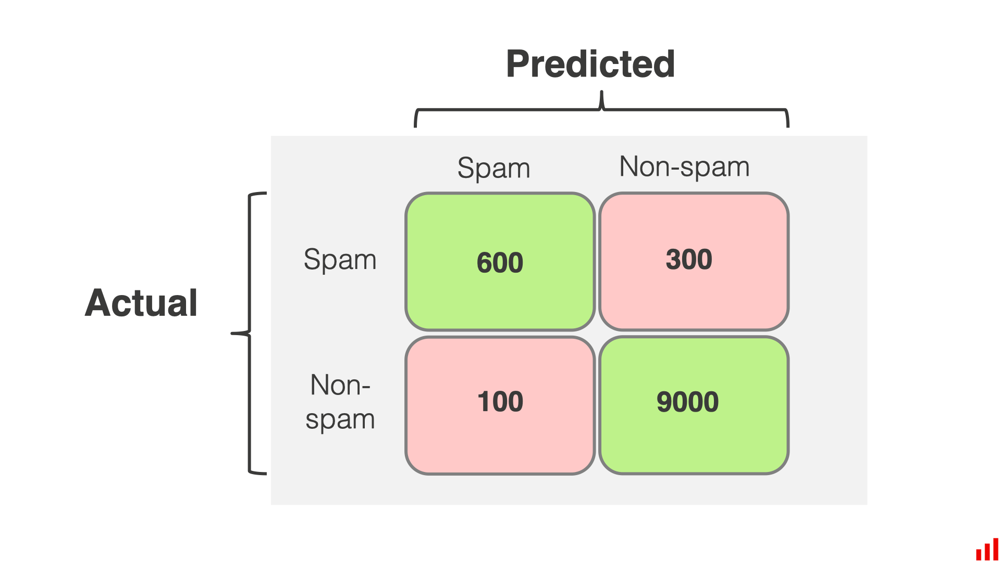

In [70]:
confusion_matrix(y_test, y_pred)

array([[9577,  192],
       [ 589,  192]])

In [71]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.94      0.98      0.96      9769
           1       0.50      0.25      0.33       781

    accuracy                           0.93     10550
   macro avg       0.72      0.61      0.65     10550
weighted avg       0.91      0.93      0.91     10550



* Acurracy - How many Of total predictions were actually correct
    * TP +TN / (TP+TN+FP+FN)

* Precision (Postive Prediction) - When the model predicts Positive class and how many of it is correct
    * TP/(TP + FP)

* Recall(Sensitivity) - How many acutal positive values were correctly predicted
    * TP / TP+FN

* F1 score = A balance Between precision and recall
    * 2 x (precision x recall) / (Precision + Recall)

* Support - The number of actual values occuring in each class in the dataset

**S curve**

In [72]:
def sigmoid(x):
  result = 1/ (1+np.exp(-x))
  return result # instead of print(result) we have to return

In [73]:
y_score = model.predict_proba(x_test)[:,1]

In [74]:
sortInd = np.argsort(y_score)
sortInd

array([ 742, 3558, 6714, ..., 4619, 1783, 5874])

In [75]:
sortLabel = y_test.iloc[sortInd]

In [76]:
sortScore = y_score[sortInd]

In [77]:
sortScore


array([5.42660781e-04, 5.88248819e-04, 6.06103374e-04, ...,
       9.56818884e-01, 9.66992788e-01, 9.84486099e-01])

In [78]:
x_values = np.linspace(-10,10,100)
y_sigmoid = sigmoid(x_values)
y_sigmoid

array([4.53978687e-05, 5.55606489e-05, 6.79983174e-05, 8.32200197e-05,
       1.01848815e-04, 1.24647146e-04, 1.52547986e-04, 1.86692945e-04,
       2.28478855e-04, 2.79614739e-04, 3.42191434e-04, 4.18766684e-04,
       5.12469082e-04, 6.27124987e-04, 7.67413430e-04, 9.39055039e-04,
       1.14904229e-03, 1.40591988e-03, 1.72012560e-03, 2.10440443e-03,
       2.57431039e-03, 3.14881358e-03, 3.85103236e-03, 4.70911357e-03,
       5.75728612e-03, 7.03711536e-03, 8.59898661e-03, 1.05038445e-02,
       1.28252101e-02, 1.56514861e-02, 1.90885420e-02, 2.32625358e-02,
       2.83228820e-02, 3.44451957e-02, 4.18339400e-02, 5.07243606e-02,
       6.13831074e-02, 7.41067363e-02, 8.92170603e-02, 1.07052146e-01,
       1.27951705e-01, 1.52235823e-01, 1.80176593e-01, 2.11963334e-01,
       2.47663801e-01, 2.87185901e-01, 3.30246430e-01, 3.76354517e-01,
       4.24816868e-01, 4.74768924e-01, 5.25231076e-01, 5.75183132e-01,
       6.23645483e-01, 6.69753570e-01, 7.12814099e-01, 7.52336199e-01,
      

In [79]:
print(type(x_values), np.shape(x_values))
print(type(y_sigmoid), np.shape(y_sigmoid))

<class 'numpy.ndarray'> (100,)
<class 'numpy.ndarray'> (100,)


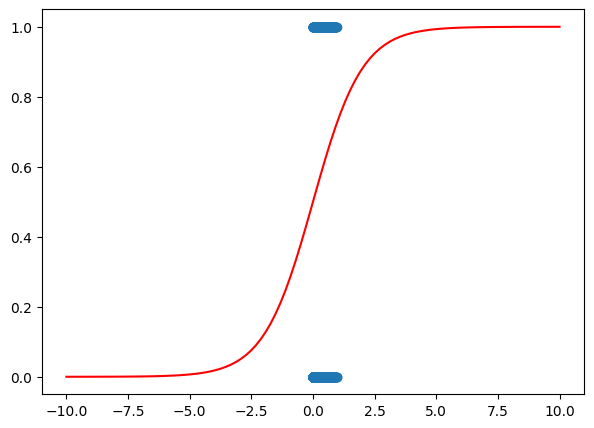

In [80]:
plt.figure(figsize = (7,5))
plt.plot(x_values,y_sigmoid, color='red')
plt.scatter(sortScore,sortLabel)
plt.show()
# Error was there in sigmoid function --> I was printing the output not returning

In [81]:
import pickle
with open('logistic_model.pkl', 'wb') as file:
    pickle.dump(model, file)

###**Bonus point**

In [82]:
import numpy as np

def sigmoid(x):
  result = 1/ (1+np.exp(-x))
  print(result)

sigmoid(3) # ----> Converting output in between 0 -1


0.9525741268224334
